In [1]:
# importação de arquivo
import pandas as pd
import numpy as np
# visualização de gráficos
import seaborn as sns
# visualização de gráficos
import matplotlib.pyplot as plt
# visualizar grafico dinâmico 
import plotly.express as px


/var/folders/vq/2hrn0h_n07g09ltbxxy7p30jfw_32m/T/ipykernel_77966/2116114915.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
base_census = pd.read_csv('../data/bases_de_dados/census.csv')

In [3]:
# Age é inteiro -> numeticas -> discreta
# workclass string -> categoricas -> Nominal (nao é ordinal pq não existe uma ordenação entre os valores)
# final-weight -> numericas -> continua por ter numeros muito grande
# education -> categoricas -> ordinal (existe uma ordem de nivel de ensino) 
# education-num -> valores inteiros -> discreta 
# marital-status, ocupation, relationship, race, sex -> categoricas -> nominal(nenhum valor é melhor do que outra ou seja não é ordenal)
#  capital gain and loss -> numericas -> continuas (valores bem dispersos)
# hour-per-week -> numericos -> discreta 
# native-country -> categoricas -> nominal
# income -> categorica -> ordinal (pelo o fato que existe uma ordem) (esse variavel será a classe que iremos prever
base_census

,age,workclass,final-weight,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loos,hour-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32557,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32558,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32559,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [7]:
base_census.describe()

,age,final-weight,education-num,capital-gain,capital-loos,hour-per-week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [5]:
#  validar se existe algum valor faltante
base_census.isnull().sum()


age               0
workclass         0
final-weight      0
education         0
education-num     0
marital-status    0
occupation        0
relationship      0
race              0
sex               0
capital-gain      0
capital-loos      0
hour-per-week     0
native-country    0
income            0
dtype: int64

# Visualização dos dados

In [6]:
np.unique(base_census['income'], return_counts=True)

(array([' <=50K', ' >50K'], dtype=object), array([24720,  7841]))

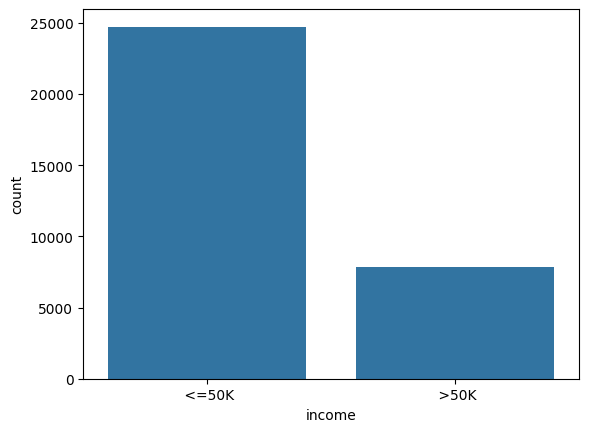

In [15]:
sns.countplot(x=base_census['income']);
# notasse que está desbalanceada

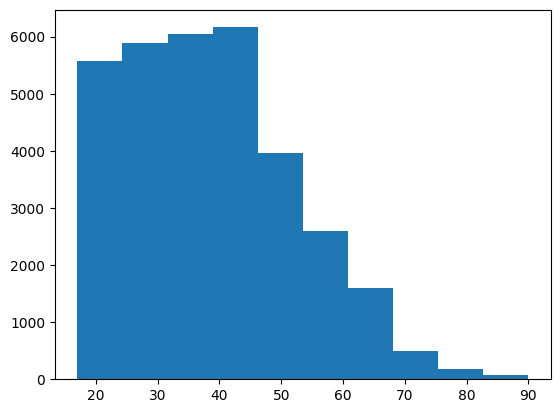

In [18]:
plt.hist(x=base_census['age']);

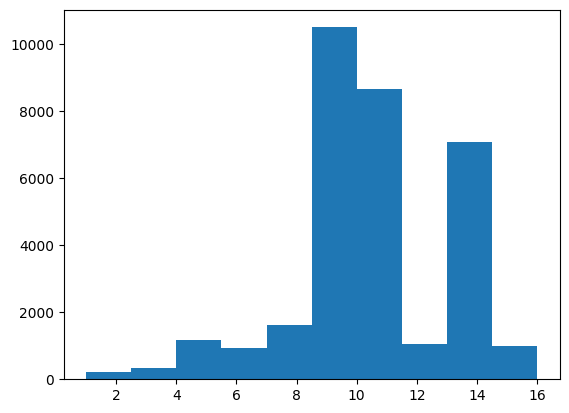

In [20]:
plt.hist(x=base_census['education-num']);

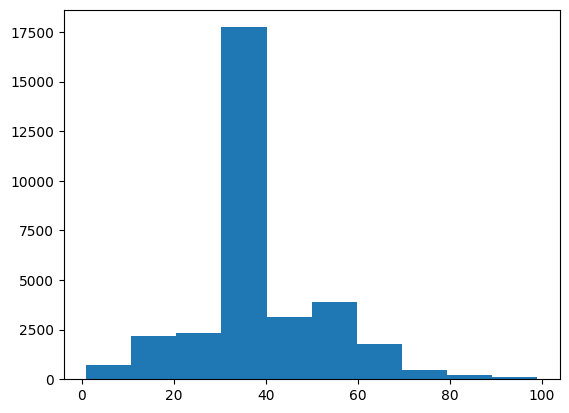

In [21]:
plt.hist(x=base_census['hour-per-week']);

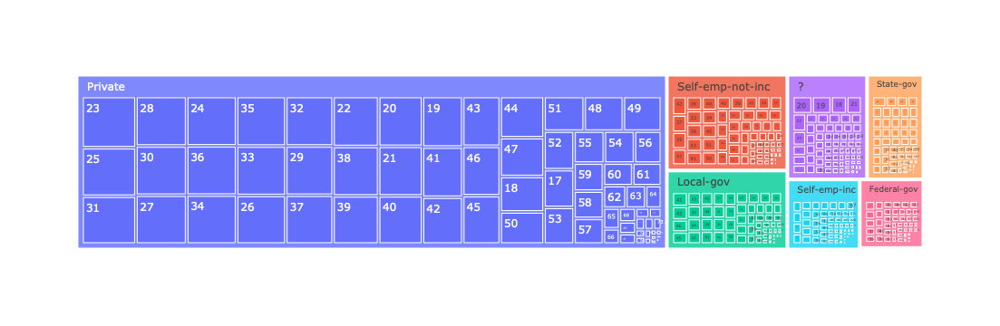

In [23]:
grafico = px.treemap(base_census, path=['workclass', 'age'])
grafico.show()

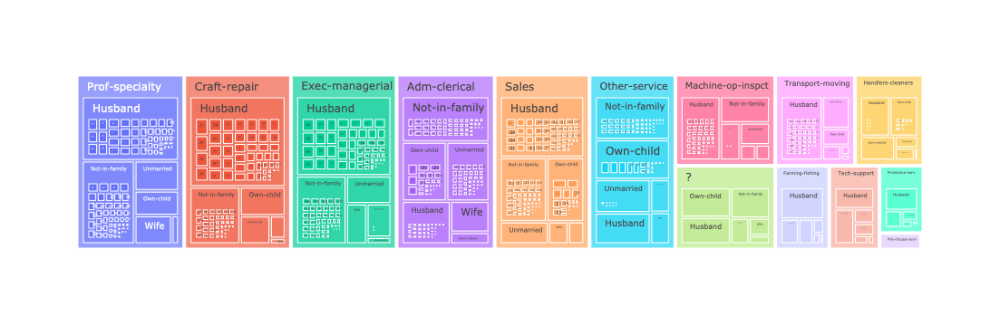

In [26]:
grafico = px.treemap(base_census, path=['occupation', 'relationship', 'age'])
grafico.show()

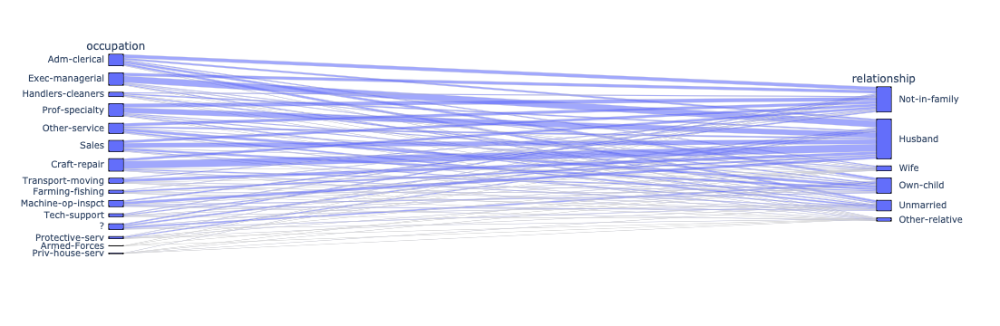

In [31]:
grafico = px.parallel_categories(base_census, dimensions=['occupation', 'relationship']);
grafico.show();

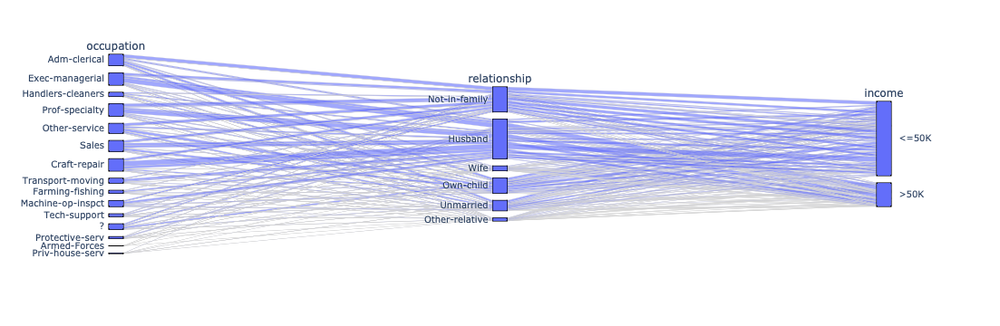

In [34]:
grafico = px.parallel_categories(base_census, dimensions=['occupation', 'relationship', 'income']);
grafico.show();

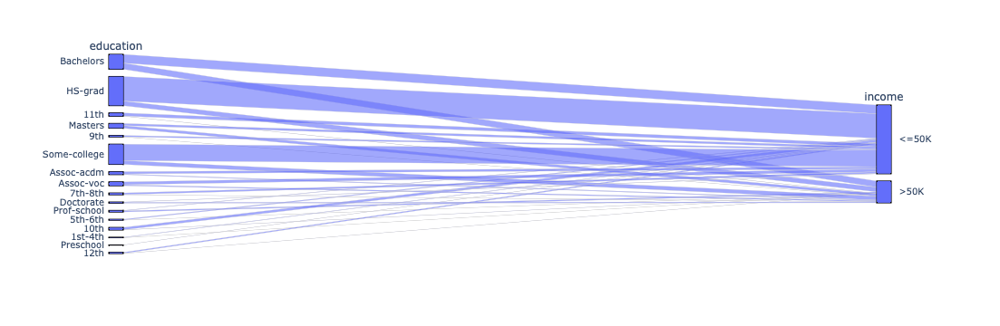

In [37]:
grafico = px.parallel_categories(base_census, dimensions=['education', 'income']);
grafico.show();

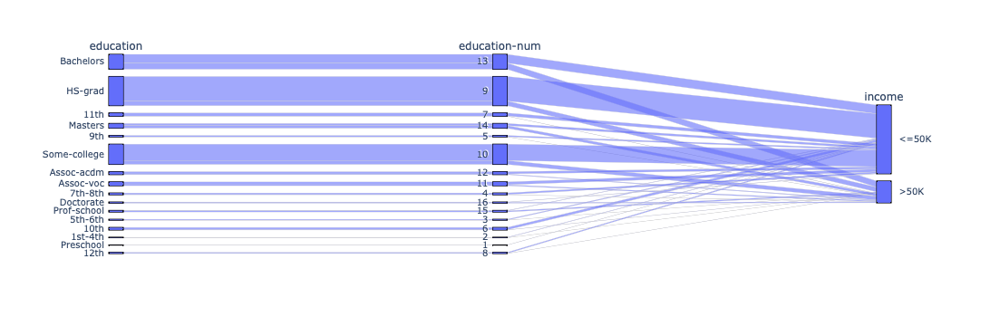

In [39]:
grafico = px.parallel_categories(base_census, dimensions=['education', 'education-num', 'income']);
grafico.show();

# Divisao entre previsores e classe

In [4]:
# x -> previsores
# y -> classe
# iloc (indica que vamos selecionar registros) o : -> (para pegar todos as linhas) e 0:14 (pegar as 13 colunas inciais assim ignorando o income

X_census = base_census.iloc[:, 0:14].values
X_census

array([[39, ' State-gov', 77516, ..., 0, 40, ' United-States'],
       [50, ' Self-emp-not-inc', 83311, ..., 0, 13, ' United-States'],
       [38, ' Private', 215646, ..., 0, 40, ' United-States'],
       ...,
       [58, ' Private', 151910, ..., 0, 40, ' United-States'],
       [22, ' Private', 201490, ..., 0, 20, ' United-States'],
       [52, ' Self-emp-inc', 287927, ..., 0, 40, ' United-States']],
      dtype=object)

In [5]:
y_census = base_census.iloc[:,14].values
y_census

array([' <=50K', ' <=50K', ' <=50K', ..., ' <=50K', ' <=50K', ' >50K'],
      dtype=object)

# Tratamento de dados

## LabelEncoder

In [6]:
# transformando string para numero
from sklearn.preprocessing import LabelEncoder

In [7]:
base_census

,age,workclass,final-weight,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loos,hour-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32557,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32558,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32559,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [8]:
# todas as linhas e somente a primeira coluna
X_census[:,1]

array([' State-gov', ' Self-emp-not-inc', ' Private', ..., ' Private',
       ' Private', ' Self-emp-inc'], dtype=object)

In [9]:
label_encoder_teste = LabelEncoder()

In [10]:
test = label_encoder_teste.fit_transform(X_census[:,1])
# cria um enum para cada valor repetido (ajudando fazer calculos matematicos)
test

array([7, 6, 4, ..., 4, 4, 5])

In [11]:
X_census[0]

array([39, ' State-gov', 77516, ' Bachelors', 13, ' Never-married',
       ' Adm-clerical', ' Not-in-family', ' White', ' Male', 2174, 0, 40,
       ' United-States'], dtype=object)

In [12]:
label_encoder_workclass = LabelEncoder()
label_encoder_education = LabelEncoder()
label_encoder_marital = LabelEncoder()
label_encoder_ocupation = LabelEncoder()
label_encoder_relationship = LabelEncoder()
label_encoder_race = LabelEncoder()
label_encoder_sex = LabelEncoder()
label_encoder_country = LabelEncoder()

In [13]:
X_census[:,1] = label_encoder_workclass.fit_transform(X_census[:,1])
X_census[:,3] = label_encoder_education.fit_transform(X_census[:,3])
X_census[:,5] = label_encoder_marital.fit_transform(X_census[:,5])
X_census[:,6] = label_encoder_ocupation.fit_transform(X_census[:,6])
X_census[:,7] = label_encoder_relationship.fit_transform(X_census[:,7])
X_census[:,8] = label_encoder_race.fit_transform(X_census[:,8])
X_census[:,9] = label_encoder_sex.fit_transform(X_census[:,9])
X_census[:,13] = label_encoder_country.fit_transform(X_census[:,13])

In [14]:
X_census[0]

array([39, 7, 77516, 9, 13, 4, 1, 1, 4, 1, 2174, 0, 40, 39], dtype=object)

## OneHotEncoder

In [68]:
# oneHotEnconder ajudar a padronizar os valores não tendo um atributo mais importante que a outra, tirando o peso da colunas,
# fazer com que cada valores tendo o mesmo peso
# GOL Palio Uno
#  1    2    3

# GOL     1 0 0
# Palio   0 1 0
# Uno     0 0 1

In [15]:
len(np.unique(base_census['workclass'])) # 1 0 0 0 0 0 0 0, 0 1 0 0 0 0 0 0 0

9

In [16]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

In [17]:
# OneHot -> tipo de transformação
# passthrough -> não ira apagar os outros atributos

onehotencoder_census = ColumnTransformer(transformers=[('OneHot', OneHotEncoder(), [1,3,5,6,7,8,9,13])], remainder='passthrough')

In [18]:
X_census = onehotencoder_census.fit_transform(X_census).toarray()

In [19]:
X_census[0]

array([0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 1.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e

In [20]:
# 108 colunas agr 
X_census.shape

(32561, 108)

# Escalonamento dos valores

In [21]:
from sklearn.preprocessing import StandardScaler

# padronização que é
# x = (x - media(x))/desvioPadrao(x)
scaler_census = StandardScaler()
X_census = scaler_census.fit_transform(X_census) 

In [22]:
X_census[0]

array([-0.2444502 , -0.17429511, -0.26209736, -0.01466381, -1.5167923 ,
       -0.18838933, -0.29093568,  4.90769968, -0.02073999, -0.17175325,
       -0.19348662, -0.11609195, -0.07201601, -0.10164955, -0.1422718 ,
       -0.12664495, -0.18406376, -0.21053433,  2.25399324, -0.11334387,
       -0.68994199, -0.23637391, -0.03960742, -0.13419553, -0.53714425,
       -0.39750806, -0.02658695, -0.92284068, -0.11403678,  1.43105786,
       -0.1802846 , -0.17735813, -0.24494366,  2.76348874, -0.01662771,
       -0.37949517, -0.37774555, -0.17745022, -0.20957797, -0.25595432,
       -0.33554133, -0.06780164, -0.38166338, -0.14260848, -0.35531609,
       -0.17127887, -0.22710355, -0.82533335,  1.70899099, -0.17624972,
       -0.42934582, -0.34403232, -0.22492681, -0.09820087, -0.18155194,
       -0.32576824, -0.09161163,  0.4130197 , -0.70307135,  0.70307135,
       -0.13502327, -0.02416321, -0.06107342, -0.0480488 , -0.04260602,
       -0.05409379, -0.04641598, -0.02933708, -0.05714946, -0.05

# Avaliar algoritmo

In [21]:
# base de dados de treinamento e base de teste
# consegue validar na tabela de propabilitade da classe
# quando for testar a abse de teste -> Conseguimos entender quanto está acertando e o quanto ta errando, assim conseguimos
# medir o qt ta acertando o meu modelo

# Divisão das bases em treinamento e teste

In [23]:
from sklearn.model_selection import train_test_split

In [24]:
X_census_treinamento, X_census_teste, y_census_treinamento, y_census_teste = train_test_split(X_census, y_census, test_size=0.15, random_state=0)

In [25]:
X_census_treinamento.shape

(27676, 108)

In [27]:
y_census_treinamento.shape

(27676,)

In [29]:
X_census_teste.shape

(4885, 108)

In [30]:
y_census_teste.shape

(4885,)

# Salvar as variáveis

In [26]:
import pickle

In [28]:
with open('./../base/census.pkl', mode='wb') as f:
    pickle.dump([X_census_treinamento, y_census_treinamento, X_census_teste, y_census_teste], f)